# 🩺 Otkrivanje upale pluća korišćenjem Mašinskog učenja 🔬


## 1. Problem

Identifikacija upale pluća uz pomoć rengenskih snimaka.

## 2. Podaci

Podaci koji se koriste u radu preuzeti su sa sajta Kaggle.
https://www.kaggle.com/paultimothymooney/chest-xray-pneumonia

Set podataka organizovan je u 3 foldera (train, test, val) u okviru kojih se nalaze jos po 2 foldera sa slikama za svaku kategoriju (Pneumonia, Normal).
U setu podataka nalazi se 5,863 slika rengenskih snimaka JPEG formata.

## 3. Procena

Za procenu modela se koristi preciznost klasifikacije (accuracy).

## 4. Karakteristike

Dodatne informacije o podacima:
* S obzirom da se koriste slike (nestruktuirani podaci) u radu se koristi duboko učenje (Deep Learning) i prenosno učenje (Transfer Learning).
* Postoje 2 klase (Normal / Pneumonia).
* U setu za treniranje postoji 5,218 slika.
* U setu za testiranje postoji 624 slika.
* Pošto u setu za validaciju imamo mali broj slika, set za validaciju ćemo kreirati iz seta za treniranje.

## Priprema okruženja za rad

* Uvesti Tensorflow 2.x ✅
* Uvesti TensorFlow Hub ✅
* Proveriti da li se koristi GPU (Graphics Processing Unit) ✅

In [ ]:
# Uvoz neophodnih alata
import tensorflow as tf
import tensorflow_hub as hub
print("TF version:", tf.__version__)
print("TF Hub version:", hub.__version__)

# Provera dostupnosti GPU-a
print("GPU", "available!" if tf.config.list_physical_devices("GPU") else "not available!")

TF version: 2.3.0
TF Hub version: 0.9.0
GPU available!


## Priprema podataka (pretvaranje u Tenzore)

Kod svih modela mašinskog učenja, podaci moraju biti numeričkog formata.
Prema tome, prvi zadatak će biti pretvaranje slika u Tenzore (numeričke prikaze).


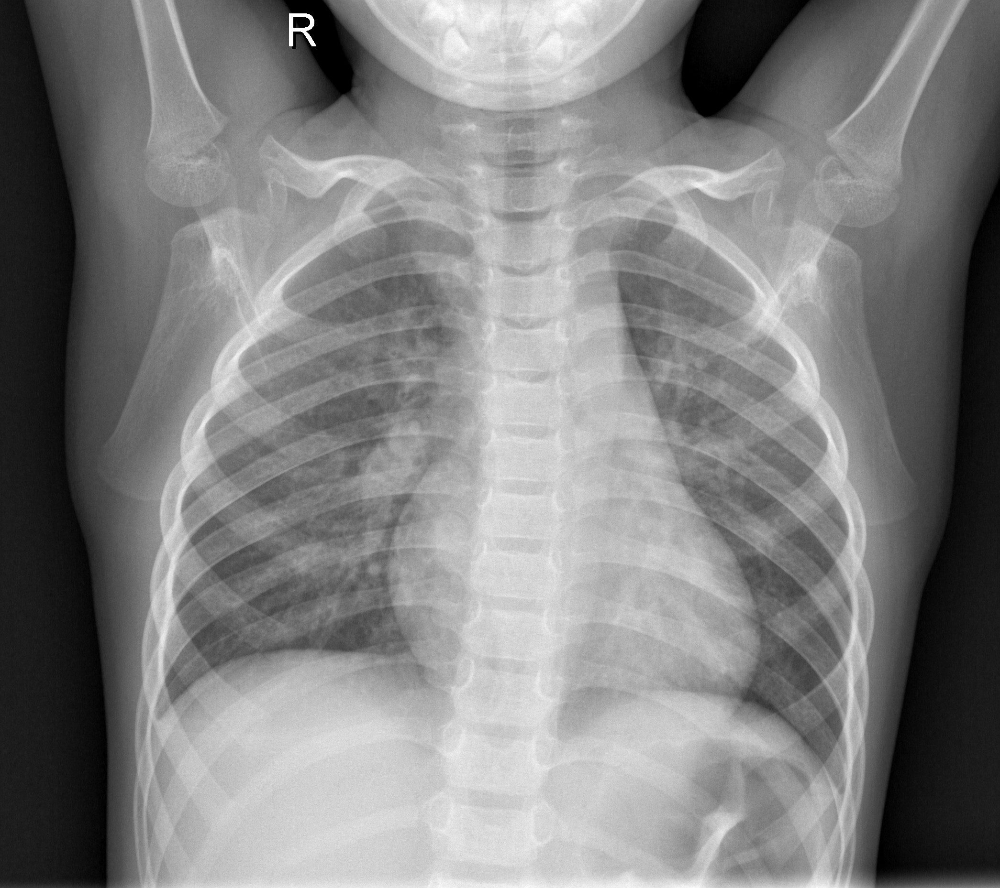

In [ ]:
# Provera učitanih podataka
import pandas as pd
from IPython.display import Image

Image("drive/My Drive/Chest X-Ray/chest_xray/train/NORMAL/IM-0115-0001.jpeg", width=300, height=300)


### Dobijanje slika i njihovih labela

Napravićemo listu sa putanjama učitanih slika.

In [ ]:
# Kreiranje naziva putanja od imena slika.
filenames = tf.io.gfile.glob(str('drive/My Drive/Chest X-Ray/chest_xray/train/*/*'))
filenames[:10]

['drive/My Drive/Chest X-Ray/chest_xray/train/NORMAL/NORMAL2-IM-0827-0001.jpeg',
 'drive/My Drive/Chest X-Ray/chest_xray/train/NORMAL/NORMAL2-IM-0832-0001.jpeg',
 'drive/My Drive/Chest X-Ray/chest_xray/train/NORMAL/NORMAL2-IM-0832-0001-0001.jpeg',
 'drive/My Drive/Chest X-Ray/chest_xray/train/NORMAL/NORMAL2-IM-0829-0001.jpeg',
 'drive/My Drive/Chest X-Ray/chest_xray/train/NORMAL/NORMAL2-IM-0825-0001.jpeg',
 'drive/My Drive/Chest X-Ray/chest_xray/train/NORMAL/NORMAL2-IM-0807-0001.jpeg',
 'drive/My Drive/Chest X-Ray/chest_xray/train/NORMAL/NORMAL2-IM-0812-0001.jpeg',
 'drive/My Drive/Chest X-Ray/chest_xray/train/NORMAL/NORMAL2-IM-0806-0001.jpeg',
 'drive/My Drive/Chest X-Ray/chest_xray/train/NORMAL/NORMAL2-IM-0831-0001.jpeg',
 'drive/My Drive/Chest X-Ray/chest_xray/train/NORMAL/NORMAL2-IM-0810-0001.jpeg']

In [ ]:
# Provera da li je broj naziva putanja jednak broju slika
import os

normal = len(os.listdir("drive/My Drive/Chest X-Ray/chest_xray/train/NORMAL/"))
pneumonia = len(os.listdir("drive/My Drive/Chest X-Ray/chest_xray/train/PNEUMONIA/"))
if (normal+pneumonia) == len(filenames):
  print("Filenames match actual amount of files!")
else:
  print("Filenames do not match actual amout of files, check the target directory")


Filenames match actual amount of files!


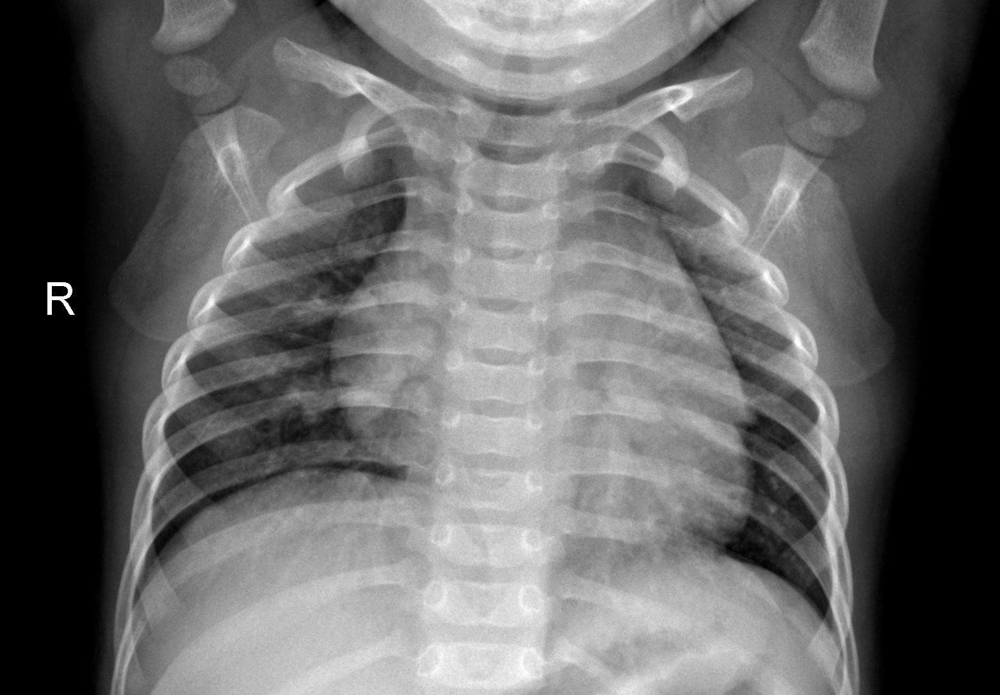

In [ ]:
Image(filenames[1000], height=300, width=300)

Budući da imamo nazive putanja slika u listi, potrebno je sada pripremiti i oznake.


In [ ]:
# Kreiranje liste sa oznakama na osnovu koji će se vršiti klasifikacija
import numpy as np

classes = np.array([str(tf.strings.split(item, os.path.sep)[-1].numpy())[2:-1]
                        for item in tf.io.gfile.glob(str('drive/My Drive/Chest X-Ray/chest_xray/train/*'))])
classes

array(['NORMAL', 'PNEUMONIA'], dtype='<U9')

In [ ]:
# Kreiranje liste sa oznakama slika
normal_labels = ["NORMAL" for x in range(normal)]
pneumonia_labels = ["PNEUMONIA" for x in range(pneumonia)]

In [ ]:
labels = normal_labels + pneumonia_labels
labels[:10], labels[-10:]

(['NORMAL',
  'NORMAL',
  'NORMAL',
  'NORMAL',
  'NORMAL',
  'NORMAL',
  'NORMAL',
  'NORMAL',
  'NORMAL',
  'NORMAL'],
 ['PNEUMONIA',
  'PNEUMONIA',
  'PNEUMONIA',
  'PNEUMONIA',
  'PNEUMONIA',
  'PNEUMONIA',
  'PNEUMONIA',
  'PNEUMONIA',
  'PNEUMONIA',
  'PNEUMONIA'])

In [ ]:
# Provera da li je broj oznaka jednak broju naziva putanja
if len(labels) == len(filenames):
  print("Number of labels matches number of filenames!")
else:
  print("Number of labels does not match number of filenames, check data directories.")

Number of labels matches number of filenames!


/usr/local/lib/python3.6/dist-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning


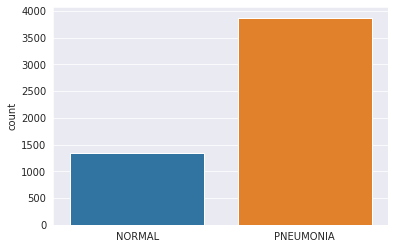

In [ ]:
# Prikaz odnosa između klasa
import seaborn as sns

sns.set_style('darkgrid')
sns.countplot(labels)      

In [ ]:
# Pretvaranje oznaka u niz logičkih vrednosti
boolean_labels = [label == classes for label in labels]
boolean_labels[:2]

[array([ True, False]), array([ True, False])]

In [ ]:
len(boolean_labels)

5216

In [ ]:
# Pretvaranje niza logičkih vrednosti u celobrojne vrednosti
print(labels[0]) # originalna oznaka
print(np.where(classes == labels[0])) # indeks gde se pojavljuje oznaka
print(boolean_labels[0].argmax()) # indeks gde se oznaka pojavljuje u nizu logičkih vrednosti
print(boolean_labels[0].astype(int)) # na indeksu gde se pojavljuje oznaka, stavljamo 1, ostalim vrednostima 0

NORMAL
(array([0]),)
0
[1 0]


## Kreiranje seta validacionih podataka

S obzirom da u setu za validaciju nema dovoljno vrednosti, napravićemo validacioni set iz seta podataka za treniranje.

In [ ]:
# Podešavanje X i y promenljive
from sklearn.utils import shuffle

X = filenames
y = boolean_labels
X, y = shuffle(X, y, random_state=42)


In [ ]:
X[:8], y[:8]

(['drive/My Drive/Chest X-Ray/chest_xray/train/PNEUMONIA/person600_virus_1156.jpeg',
  'drive/My Drive/Chest X-Ray/chest_xray/train/NORMAL/NORMAL2-IM-0803-0001.jpeg',
  'drive/My Drive/Chest X-Ray/chest_xray/train/PNEUMONIA/person1446_bacteria_3737.jpeg',
  'drive/My Drive/Chest X-Ray/chest_xray/train/PNEUMONIA/person1239_virus_2099.jpeg',
  'drive/My Drive/Chest X-Ray/chest_xray/train/PNEUMONIA/person739_virus_1361.jpeg',
  'drive/My Drive/Chest X-Ray/chest_xray/train/PNEUMONIA/person1227_virus_2078.jpeg',
  'drive/My Drive/Chest X-Ray/chest_xray/train/NORMAL/NORMAL2-IM-0776-0001.jpeg',
  'drive/My Drive/Chest X-Ray/chest_xray/train/NORMAL/IM-0533-0001.jpeg'],
 [array([False,  True]),
  array([ True, False]),
  array([False,  True]),
  array([False,  True]),
  array([False,  True]),
  array([False,  True]),
  array([ True, False]),
  array([ True, False])])

Eksperimentisanje počinjemo sa ~1000 slika i povećavamo taj broj po potrebi.

In [ ]:
# Postavljanje broja slika koje ćemo koristiti za eksperimentisanje
NUM_IMAGES = 1000 #@param {type:"slider", min:1000, max:5000, step:500}

In [ ]:
# Podela podataka u setove za treniranje i validaciju
from sklearn.model_selection import train_test_split

# Podela u setove sa brojem slika definisanim u prethodnom koraku
X_train, X_val, y_train, y_val = train_test_split(X[:NUM_IMAGES],
                                                  y[:NUM_IMAGES],
                                                  test_size=0.2,
                                                  random_state=42)

len(X_train), len(y_train), len(X_val), len(y_val)

(800, 800, 200, 200)

In [ ]:
X_train[:5], y_train[:5]

(['drive/My Drive/Chest X-Ray/chest_xray/train/NORMAL/NORMAL2-IM-1258-0001-0002.jpeg',
  'drive/My Drive/Chest X-Ray/chest_xray/train/PNEUMONIA/person1729_bacteria_4557.jpeg',
  'drive/My Drive/Chest X-Ray/chest_xray/train/PNEUMONIA/person565_bacteria_2348.jpeg',
  'drive/My Drive/Chest X-Ray/chest_xray/train/PNEUMONIA/person347_bacteria_1597.jpeg',
  'drive/My Drive/Chest X-Ray/chest_xray/train/NORMAL/IM-0736-0001.jpeg'],
 [array([ True, False]),
  array([False,  True]),
  array([False,  True]),
  array([False,  True]),
  array([ True, False])])

## Predobrada slika (pretvaranje slika u Tenzore)

Za predobradu slika u Tenzore potrebno je napraviti funkciju koja će da radi sledeće stvari:
1. Uzima putanju slike kao ulaz.
2. Koristi TensorFlow da pročita sliku i sačuva je u promenljivu `image`.
3. Pretvara promenljivu `image` (jpeg) u Tenzor.
4. Normalizuje sliku (pretvara vrednosti kanala boja iz 0-255 u 0-1)
5. Menja veličinu slike u oblik (224,224)
6. Vraća izmenjenu promenljivu `image`.

In [ ]:
# Definisanje veličine slike
IMG_SIZE = 224

# Kreiranje funkcije za predobradu slika
def process_image(image_path, img_size=IMG_SIZE):
  """
  Uzima putanju slike i pretvara sliku u Tenzor.
  """
  # Čitanje slike
  image = tf.io.read_file(image_path)
  # Pretvaranje jpeg slike u numerički Tenzor sa 3 kanala boja (R,G,B)
  image = tf.image.decode_jpeg(image, channels=3)
  # Pretvaranje vrednosti kanala boja sa 0-255 u 0-1 
  image = tf.image.convert_image_dtype(image, tf.float32)
  # Menja veličinu slike prema parametru definisanom na početku
  image = tf.image.resize(image, size=[IMG_SIZE, IMG_SIZE])

  return image

## Grupisanje podataka

Zašto je potrebno grupisanje slika?
Ukoliko imamo veliki broj slika i pokušamo da obradimo sve od jednom, postoji mogućnost da ne stanu sve u memoriju. Iz tog razloga ih moramo podeliti na grupe.

Da bi efikasno iskoristili TensorFlow, potrebni su nam podaci u obliku:
`(slika, oznaka)`.

In [ ]:
# Kreirati funkciju koja vraća torku (slika, oznaka)
def get_image_label(image_path, label):
  """
  Uzima putanju slike i oznaku te slike, obrađuje sliku i vraća torku u obliku (slika, oznaka)
  """
  image = process_image(image_path)
  return image, label

In [ ]:
# Prikaz očekivanog izlaza prethodne fukncije
(process_image(X[42]), tf.constant(y[42]))

(<tf.Tensor: shape=(224, 224, 3), dtype=float32, numpy=
 array([[[0.49383757, 0.49383757, 0.49383757],
         [0.3535014 , 0.3535014 , 0.3535014 ],
         [0.25462186, 0.25462186, 0.25462186],
         ...,
         [0.64929974, 0.64929974, 0.64929974],
         [0.67044824, 0.67044824, 0.67044824],
         [0.70427173, 0.70427173, 0.70427173]],
 
        [[0.5072129 , 0.5072129 , 0.5072129 ],
         [0.25882354, 0.25882354, 0.25882354],
         [0.23277313, 0.23277313, 0.23277313],
         ...,
         [0.6652661 , 0.6652661 , 0.6652661 ],
         [0.6651961 , 0.6651961 , 0.6651961 ],
         [0.6761905 , 0.6761905 , 0.6761905 ]],
 
        [[0.46932778, 0.46932778, 0.46932778],
         [0.24901962, 0.24901962, 0.24901962],
         [0.2809524 , 0.2809524 , 0.2809524 ],
         ...,
         [0.6740896 , 0.6740896 , 0.6740896 ],
         [0.6511905 , 0.6511905 , 0.6511905 ],
         [0.66589636, 0.66589636, 0.66589636]],
 
        ...,
 
        [[0.        , 0.        

Sada kad imamo funkciju za kreiranje torki Tenzora u formi `(slika, oznaka)`, napravićemo funkciju da pretvorimo sve podatke (X i y) u grupe.

In [ ]:
# Definisanje veličine grupe
BATCH_SIZE = 32

# Kreiranje funkcije za grupisanje podataka
def create_data_batches(X,y=None, batch_size=BATCH_SIZE, valid_data=False, test_data=False):
  """
  Kreira grupe podataka sa parovima slika (X) i oznaka (y).
  Dodatno meša podatke ukoliko se kreira set za treniranje.
  Prihvata podatke za test set (podaci bez oznaka).
  """
  # U nekim slucajevima, test setovi nemaju oznake
  if test_data:
    print("Creating test data batches...")
    data = tf.data.Dataset.from_tensor_slices((tf.constant(X))) # putanje slika
    data = data.shuffle(buffer_size=len(X)) 
    data_batch = data.map(process_image).batch(BATCH_SIZE)
    return data_batch
  
  elif valid_data:
    print("Creating validation data batches...")
    data = tf.data.Dataset.from_tensor_slices((tf.constant(X), # putanje slika
                                               tf.constant(y))) # oznake
    data_batch = data.map(get_image_label).batch(BATCH_SIZE)
    return data_batch

  else:
    print("Creating training data batches...")
    # Pretvaranje putanja slika i oznaka u Tenzore
    data = tf.data.Dataset.from_tensor_slices((tf.constant(X), # putanje slika
                                               tf.constant(y))) # oznake

    data = data.shuffle(buffer_size=len(X))
    # Kreiranje (slika,oznaka) torki
    data = data.map(get_image_label)
    data_batch = data.batch(BATCH_SIZE)
  return data_batch

In [ ]:
# Kreiranje podataka za treniranje i validaciju
train_data = create_data_batches(X_train, y_train)
val_data = create_data_batches(X_val, y_val, valid_data=True)

Creating training data batches...
Creating validation data batches...


In [ ]:
# Provera oblika dobijenih podataka
train_data.element_spec, val_data.element_spec

((TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None),
  TensorSpec(shape=(None, 2), dtype=tf.bool, name=None)),
 (TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None),
  TensorSpec(shape=(None, 2), dtype=tf.bool, name=None)))

## Vizuelizacija grupa podataka


In [ ]:
import matplotlib.pyplot as plt

# Kreiranje funkcije za pregled slika iz grupe podataka
def show_25_images(images, labels):
  """
  Prikazuje 25 slika sa njihovim oznaka iz jedne grupe podataka.
  """
  plt.figure(figsize=(15,15))
  for i in range(25):
    ax = plt.subplot(5, 5, i+1)
    # Prikaz slike
    plt.imshow(images[i])
    # Dodavanje oznake kao naslov slike
    plt.title(classes[labels[i].argmax()])
    plt.axis("off")

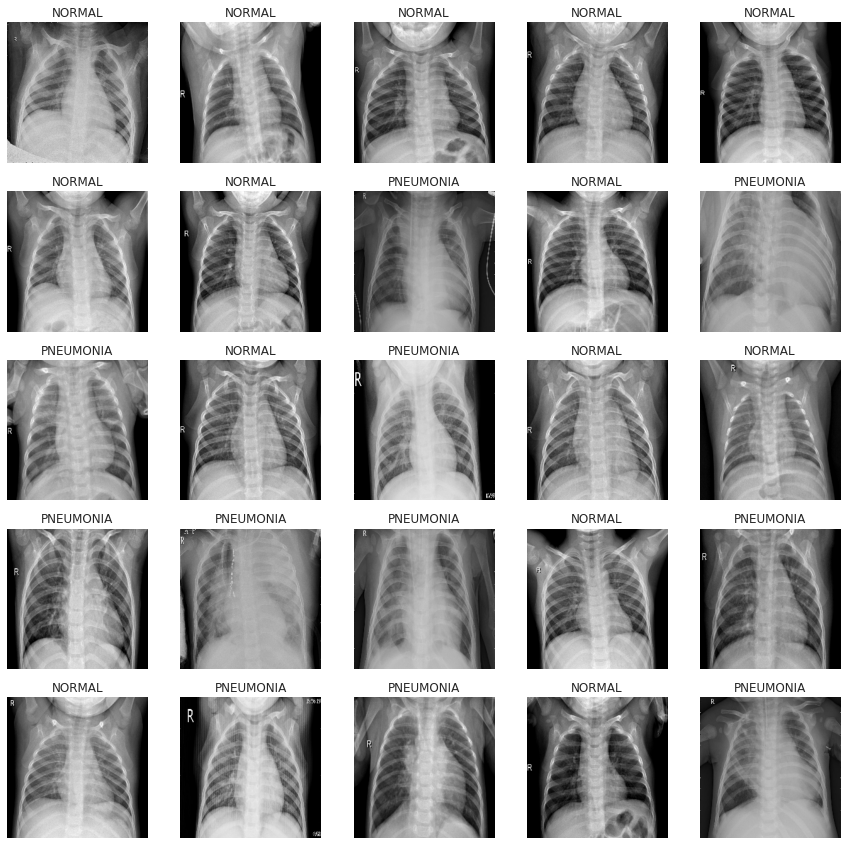

In [ ]:
# Vizuelizacija podataka iz grupe seta za treniranje
train_images, train_labels = next(train_data.as_numpy_iterator())
show_25_images(train_images, train_labels)

In [ ]:
len(train_images)

32

## Kreiranje modela

Pre nego što krenemo sa izradom modela, najpre je potrebno definisati:
* Ulazni oblik podataka za model (prethodno kreirani oblik slika).
* Izlazni oblik podataka za model (oznake slika, u obliku Tenzora).

In [ ]:
# Definisanje ulaznog oblika za model
INPUT_SHAPE = [None, IMG_SIZE, IMG_SIZE, 3] # grupa, visina, širina, broj kanala boja

# Definisanje izlaznog oblika za model
OUTPUT_SHAPE = len(classes)

# Definisanje URL modela sa TensorFlow Hub-a
MODEL_URL = "https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/4"

S obzirom da je definisano sve što je potrebno za model, sve ćemo da spojimo pomoću Keras modela za duboko učenje.

Prema tome, potrebno je napraviti funkciju koja će:
* Uzeti definisane promenljive za parametre funkcije.
* Definisati sekvencijalno slojeve u Keras modelu.
* Kompajlirati model (po kojim će kriterijumima biti ocenjivan model)
* Kreirati model (kakav će biti ulazni oblik)
* Vratiti kreirani model


In [ ]:
# Kreiranje funkcije za kreiranje Keras model
def create_model(input_shape=INPUT_SHAPE, output_shape=OUTPUT_SHAPE, model_url=MODEL_URL):
  """
  Definiše slojeve, kompajlira i kreira Keras model.
  """
  print("Building model with:", MODEL_URL)

  # Definisanje slojeva u modelu
  model = tf.keras.Sequential([
                               hub.KerasLayer(MODEL_URL), # Sloj 1 (ulaz)
                               tf.keras.layers.Dense(units=OUTPUT_SHAPE, 
                                                     activation="sigmoid") # Sloj 2 (izlaz)
                              ])
  # Kompajliranje modela
  model.compile(
      loss=tf.keras.losses.BinaryCrossentropy(),
      optimizer=tf.keras.optimizers.Adam(),
      metrics=["accuracy"]
  )

  # Kreiranje modela
  model.build(INPUT_SHAPE)

  return model


In [ ]:
model = create_model()
model.summary()

Building model with: https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/4
Model: "sequential"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
keras_layer (KerasLayer)     (None, 1001)              5432713   
_________________________________________________________________
dense (Dense)                (None, 2)                 2004      
Total params: 5,434,717
Trainable params: 2,004
Non-trainable params: 5,432,713
_________________________________________________________________


## Kreiranje callback-ova

Callback-ovi su pomoćne funkcije koje model koristi tokom treniranja kako bi sačuvale njegov napredak, proveravale njegov napredak ili zaustavile treniranje ukoliko model prestane da se poboljšava.

U ovom radu će se koristiti dva callback-a, jedan (TensorBoard) koji pomaže praćenju napretka modela, a drugi za rano zaustavljanje koji sprečava da se naš model predugo trenira.

### TensorBoard Callback


In [ ]:
# Učitavanje dodatka za TensorBoard
%load_ext tensorboard

In [ ]:
import datetime

# Kreiranje funkcije za kreiranje TensorBoard callback-a
def create_tensorboard_callback():
  # Kreiranje direktorijuma u kome će se čuvati TensorBoard logovi
  logdir = os.path.join("drive/My Drive/Chest X-Ray/logs",
                        datetime.datetime.now().strftime("%Y%m%d-%H%M%S"))
  return tf.keras.callbacks.TensorBoard(logdir)

### Callback za rano zaustavljanje


In [ ]:
# Kreiranje callback-a za rano zaustavljanje
early_stopping = tf.keras.callbacks.EarlyStopping(monitor="val_accuracy", 
                                                  patience=3)

## Treniranje modela (na podskupu podataka)

Prvi model će trenirati na skupu od 1000 slika, kako bi bili sigurni da sve funkcioniše.

In [ ]:
# Definisanje broja epoha
NUM_EPOCHS = 100 #@param {type:"slider", min:10, max:100, step:10}

Funkcija za treniranje modela treba da:
* Kreira model koristeći funkciju `create_model()`.
* Kreira TensorBoard callback koristeći funkciju `create_tensorboard_callback()`.
* Pozove `fit()` funkciju na prethodno kreiranom modelu prosleđujući joj podatke za kreiranje, podatke za validaciju, broj epoha za treniranje i callbackove koje će koristiti.
* Vratiti model

In [ ]:
# Kreiranje funkcije za treniranje
def train_model():
  """
  Trenira kreirani model.
  """
  # Kreiranje modela
  model = create_model()

  # Kreiranje TensorBoard sesije kad god se trenira model
  tensorboard = create_tensorboard_callback()

  # Prilagođavanje modela podacima
  model.fit(x=train_data,
            epochs=NUM_EPOCHS,
            validation_data=val_data,
            validation_freq=1,
            callbacks=[tensorboard, early_stopping])
  
  return model

In [ ]:
# Treniranje modela
model = train_model()

Building model with: https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/4
Epoch 1/100
 1/25 [>.............................] - ETA: 0s - loss: 0.8110 - accuracy: 0.7500WARNING:tensorflow:From /usr/local/lib/python3.6/dist-packages/tensorflow/python/ops/summary_ops_v2.py:1277: stop (from tensorflow.python.eager.profiler) is deprecated and will be removed after 2020-07-01.
Instructions for updating:
use `tf.profiler.experimental.stop` instead.


Instructions for updating:
use `tf.profiler.experimental.stop` instead.


25/25 [==============================] - 374s 15s/step - loss: 0.3734 - accuracy: 0.8363 - val_loss: 0.2167 - val_accuracy: 0.8950
Epoch 2/100
25/25 [==============================] - 15s 595ms/step - loss: 0.1827 - accuracy: 0.9275 - val_loss: 0.1639 - val_accuracy: 0.9300
Epoch 3/100
25/25 [==============================] - 14s 580ms/step - loss: 0.1474 - accuracy: 0.9450 - val_loss: 0.1639 - val_accuracy: 0.9300
Epoch 4/100
25/25 [==============================] - 15s 582ms/step - loss: 0.1446 - accuracy: 0.9425 - val_loss: 0.1374 - val_accuracy: 0.9400
Epoch 5/100
25/25 [==============================] - 15s 584ms/step - loss: 0.1214 - accuracy: 0.9575 - val_loss: 0.1143 - val_accuracy: 0.9550
Epoch 6/100
25/25 [==============================] - 15s 585ms/step - loss: 0.1086 - accuracy: 0.9675 - val_loss: 0.1058 - val_accuracy: 0.9650
Epoch 7/100
25/25 [==============================] - 15s 581ms/step - loss: 0.1006 - accuracy: 0.9650 - val_loss: 0.0970 - val_accuracy: 0.9600
Epoch

### Pregled TensorBoard logova

Uz pomoć TensorBoard funkcije (`%tensorboard`), pristupamo direktorijumu sa logovima koje smo prethodno kreirali za vizuelizaciju tih informacija.

In [ ]:
%tensorboard --logdir drive/My\ Drive/Chest\ X-Ray/logs

<IPython.core.display.Javascript object>

## Obavljanje i procena predviđanja pomoću treniranog modela


In [ ]:
# Obavljanje predviđanja na validacionim podacima 
predictions = model.predict(val_data, verbose=1)
predictions[:10]

7/7 [==============================] - 2s 343ms/step


array([[1.7237145e-02, 9.9263424e-01],
       [7.3878831e-01, 2.7843696e-01],
       [4.3412888e-01, 7.6094878e-01],
       [1.7823542e-03, 9.9863392e-01],
       [1.1945519e-03, 9.9679583e-01],
       [4.6038416e-01, 7.4928242e-01],
       [1.5793199e-04, 9.9996567e-01],
       [4.4605971e-05, 9.9998927e-01],
       [1.3196875e-03, 9.9889624e-01],
       [7.5764830e-05, 9.9993753e-01]], dtype=float32)

In [ ]:
np.sum(predictions[2])

1.1950777

In [ ]:
# Prvo predviđanje
index = 0;
print(predictions[index])
print(f"Max value (probability of predictions): {np.max(predictions[index])}")
print(f"Sum: {np.sum(predictions[index])}")
print(f"Max index: {np.argmax(predictions[index])}")
print(f"Predicted label: {classes[np.argmax(predictions[index])]}")

[0.01723715 0.99263424]
Max value (probability of predictions): 0.9926342368125916
Sum: 1.0098713636398315
Max index: 1
Predicted label: PNEUMONIA


Ono što je sada potrebno jeste da ovakvo predviđanje iskoristimo u većem obimu (nad svim podacima).

In [ ]:
# Pretvaranje verovatnoće predviđanja u njihove odgovarajuće oznake
def get_pred_label(prediction_probabilities):
  """
  Pretvara niz verovatnoća predviđanja u niz oznaka.
  """

  return classes[np.argmax(prediction_probabilities)]

pred_label = get_pred_label(predictions[0])
pred_label

'PNEUMONIA'

Budući da su podaci za validaciju u grupama, moraju se prvo izvaditi iz tih grupa kako bi mogli prikazati predviđanja sa slikama i uporediti ih sa pravim oznakama.

In [ ]:
val_data

<BatchDataset shapes: ((None, 224, 224, 3), (None, 2)), types: (tf.float32, tf.bool)>

In [ ]:
# Kreiranje funkcije za vađenje podataka iz grupa
def unbatchify(data):
  """
  Uzima podatke u grupama (slika, oznaka) Tenzora i vraća posebne nizove sa slikama i oznakama.
  """
  images = []
  labels = []

  for image,label in data.unbatch().as_numpy_iterator():
    images.append(image)
    labels.append(classes[np.argmax(label)])

  return images,labels

val_images, val_labels = unbatchify(val_data)
val_images[0], val_labels[0]

(array([[[0.0000000e+00, 0.0000000e+00, 0.0000000e+00],
         [0.0000000e+00, 0.0000000e+00, 0.0000000e+00],
         [0.0000000e+00, 0.0000000e+00, 0.0000000e+00],
         ...,
         [3.8792962e-01, 3.8792962e-01, 3.8792962e-01],
         [4.1093871e-01, 4.1093871e-01, 4.1093871e-01],
         [3.8515174e-01, 3.8515174e-01, 3.8515174e-01]],
 
        [[0.0000000e+00, 0.0000000e+00, 0.0000000e+00],
         [0.0000000e+00, 0.0000000e+00, 0.0000000e+00],
         [0.0000000e+00, 0.0000000e+00, 0.0000000e+00],
         ...,
         [3.6453843e-01, 3.6453843e-01, 3.6453843e-01],
         [3.5873783e-01, 3.5873783e-01, 3.5873783e-01],
         [3.6318997e-01, 3.6318997e-01, 3.6318997e-01]],
 
        [[0.0000000e+00, 0.0000000e+00, 0.0000000e+00],
         [0.0000000e+00, 0.0000000e+00, 0.0000000e+00],
         [0.0000000e+00, 0.0000000e+00, 0.0000000e+00],
         ...,
         [9.8840755e-01, 9.8840755e-01, 9.8840755e-01],
         [9.8349559e-01, 9.8349559e-01, 9.8349559e-01],


Sada kada imamo potrebne podatke, treba napraviti funkciju koja će pomoći da vizuelno prikažemo rezultate.
Funkcija treba da:
* Uzme nizove verovatnoća predviđanja, tačnih oznaka i slika.
* Pretvori verovatnoće predviđanja u oznake slika.
* Iscrta predviđenu oznaku, njenu verovatnoću i tačnu oznaku slike, kao i samu sliku nad kojom je vršeno predviđanje.

In [ ]:
# Kreiranje funkcije koja iscrtava predviđanje slika
def plot_pred(prediction_probabilities, labels, images, n=1):
  """
  Prikazuje predviđanje na za jednu sliku
  """
  pred_prob, true_label, image = prediction_probabilities[n], labels[n], images[n]

  # Uzima oznaku predviđanja
  pred_label = get_pred_label(pred_prob)

  # Iscrtava sliku
  plt.imshow(image)
  plt.xticks([])
  plt.yticks([])

  # Menjanje boje naslova u zavisnosti da li je predviđanje tačno ili ne
  if pred_label == true_label:
    color = 'green'
  else:
    color = 'red'

  # Za naslov slike stavlja oznaku predviđanja, verovatnoću predviđanja i tačnu oznaku
  plt.title("{} {:2.0f}% {}".format(pred_label,
                                    np.max(pred_prob)*100,
                                    true_label),
                                    color=color)

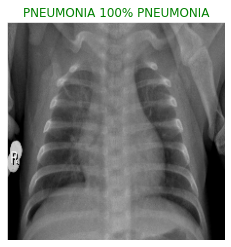

In [ ]:
plot_pred(prediction_probabilities=predictions,
          labels=val_labels,
          images=val_images,
          n=4)

S obzirom da sada imamo funkciju za iscrtavanje predviđanja, možemo da pogledamo nekoliko njih.

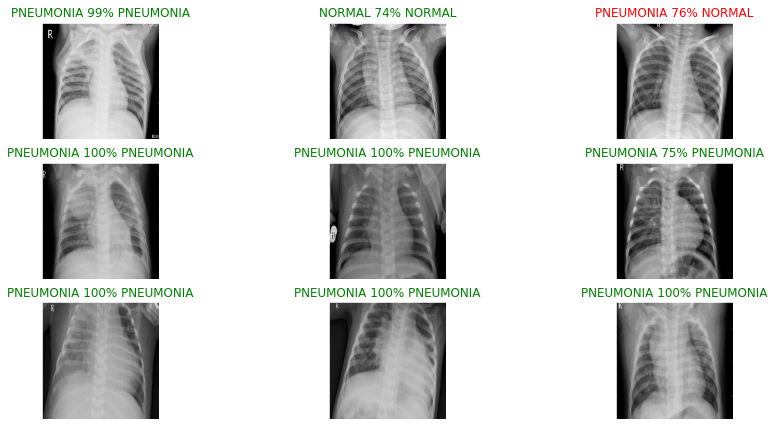

In [ ]:
# Vizuelizacija nekoliko predviđanja sa njihovim vrednostima
i_multiplier = 0;
num_rows = 3
num_cols = 3
num_images = num_rows*num_cols
plt.figure(figsize=(5*num_cols, 5*num_rows))
for i in range(num_images):
  plt.subplot(2*num_rows, 2*num_cols, 2*i+1)
  plot_pred(prediction_probabilities=predictions,
            labels=val_labels,
            images=val_images,
            n=i+i_multiplier)
plt.show()

### Konfuziona matrica

In [ ]:
val_labels[:10]

['PNEUMONIA',
 'NORMAL',
 'NORMAL',
 'PNEUMONIA',
 'PNEUMONIA',
 'PNEUMONIA',
 'PNEUMONIA',
 'PNEUMONIA',
 'PNEUMONIA',
 'PNEUMONIA']

<Figure size 432x288 with 0 Axes>

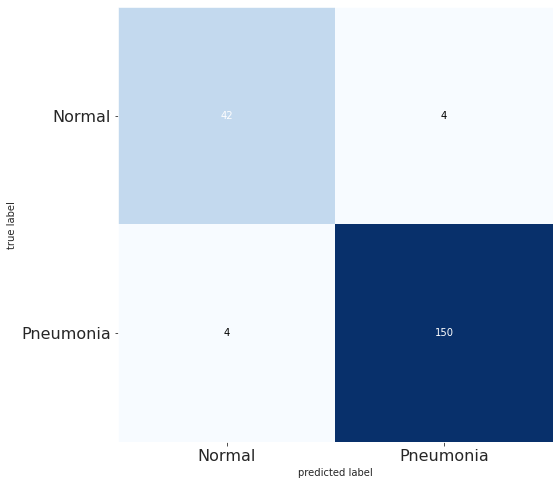

In [ ]:
# Prikazivanje konfuzione matrice
from mlxtend.plotting import plot_confusion_matrix
from sklearn.metrics import confusion_matrix

preds = []
for i in range(len(predictions)):
  preds.append(get_pred_label(predictions[i]))

cm = confusion_matrix(val_labels, preds)
plt.figure()
plot_confusion_matrix(cm, figsize=(12,8), hide_ticks=True, cmap=plt.cm.Blues)
plt.xticks(range(2), ['Normal', 'Pneumonia'], fontsize=16)
plt.yticks(range(2), ['Normal', 'Pneumonia'], fontsize=16)
plt.show()

In [ ]:
# Preciznost i kompletnost klasifikatora
tn, fp, fn, tp = cm.ravel()

precision = tp/(tp+fp)
recall = tp/(tp+fn)

print("Recall of the model is {:.2f}".format(recall))
print("Precision of the model is {:.2f}".format(precision))

Recall of the model is 0.97
Precision of the model is 0.97


## Čuvanje i ponovno učitavanje treniranog modela

In [ ]:
# Kreiranje funkcije za čuvanje modela
def save_model(model, suffix=None):
  """
  Čuva prosleđeni model u direkotrijumu za modele dodavajući mu prosleđeni sufiks.
  """
  # Kreiranje putanje za čuvanje modela sa trenutnim vremenom 
  modeldir = os.path.join("drive/My Drive/Chest X-Ray/models",
                          datetime.datetime.now().strftime("%Y%m%d-%H%M%S"))
  model_path = modeldir + "-" + suffix + ".h5" # save format of model
  print(f"Saving model to: {model_path}...")
  model.save(model_path)
  return model_path

In [ ]:
# Kreiranje funkcije za učitavanje treniranog modela
def load_model(model_path):
  """
  Učitava sačuvani model sa prosleđenom putanjom.
  """
  print(f"Loading saved model from: {model_path}")
  model = tf.keras.models.load_model(model_path,
                                     custom_objects={"KerasLayer": hub.KerasLayer})
  return model

In [ ]:
# Čuvanje treniranog modela sa 1000 slika
save_model(model, suffix="1000-images-mobilenetv2")

Saving model to: drive/My Drive/Chest X-Ray/models/20201101-210611-1000-images-mobilenetv2.h5...


'drive/My Drive/Chest X-Ray/models/20201101-210611-1000-images-mobilenetv2.h5'

In [ ]:
# Učitavanje prethodno sačuvanog modela
loaded_1000_image_model = load_model('drive/My Drive/Chest X-Ray/models/20201101-210611-1000-images-mobilenetv2.h5')

Loading saved model from: drive/My Drive/Chest X-Ray/models/20201101-210611-1000-images-mobilenetv2.h5


In [ ]:
# Procena učitanog modela
loaded_1000_image_model.evaluate(val_data)

7/7 [==============================] - 2s 272ms/step - loss: 0.0851 - accuracy: 0.9600


[0.08513662219047546, 0.9599999785423279]

In [ ]:
model.evaluate(val_data)

7/7 [==============================] - 2s 308ms/step - loss: 0.0911 - accuracy: 0.9600


[0.09107988327741623, 0.9599999785423279]

## Treniranje modela nad svim podacima

In [ ]:
len(X), len(y)

(5216, 5216)

In [ ]:
# Kreiranje grupe podataka sa celim skupom podataka
full_data = create_data_batches(X, y)

Creating training data batches...


In [ ]:
full_data

<BatchDataset shapes: ((None, 224, 224, 3), (None, 2)), types: (tf.float32, tf.bool)>

In [ ]:
# Kreiranje modela
full_model = create_model()

Building model with: https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/4


In [ ]:
# Kreiranje callback-ova
full_model_tensorboard = create_tensorboard_callback()
full_model_early_stopping = tf.keras.callbacks.EarlyStopping(monitor="accuracy",
                                                             patience=3)


In [ ]:
# Prilagođavanje modela nad celim skupom podataka
# full_model.fit(x=full_data,
#                epochs=NUM_EPOCHS,
#                callbacks=[full_model_tensorboard, full_model_early_stopping])

Epoch 1/100
163/163 [==============================] - 2957s 18s/step - loss: 0.1801 - accuracy: 0.9293
Epoch 2/100
163/163 [==============================] - 71s 437ms/step - loss: 0.1042 - accuracy: 0.9607
Epoch 3/100
163/163 [==============================] - 72s 442ms/step - loss: 0.0886 - accuracy: 0.9661
Epoch 4/100
163/163 [==============================] - 71s 439ms/step - loss: 0.0784 - accuracy: 0.9714
Epoch 5/100
163/163 [==============================] - 72s 441ms/step - loss: 0.0745 - accuracy: 0.9711
Epoch 6/100
163/163 [==============================] - 72s 439ms/step - loss: 0.0681 - accuracy: 0.9743
Epoch 7/100
163/163 [==============================] - 72s 442ms/step - loss: 0.0639 - accuracy: 0.9762
Epoch 8/100
163/163 [==============================] - 71s 438ms/step - loss: 0.0609 - accuracy: 0.9785
Epoch 9/100
163/163 [==============================] - 72s 439ms/step - loss: 0.0586 - accuracy: 0.9793
Epoch 10/100
163/163 [==============================] - 71s 437m

In [ ]:
# save_model(full_model, suffix="full-image-set")

Saving model to: drive/My Drive/Chest X-Ray/models/20201003-222024-full-image-set.h5...


'drive/My Drive/Chest X-Ray/models/20201003-222024-full-image-set.h5'

In [ ]:
loaded_full_model = load_model("drive/My Drive/Chest X-Ray/models/20201003-222024-full-image-set.h5")

Loading saved model from: drive/My Drive/Chest X-Ray/models/20201003-222024-full-image-set.h5


## Obavljanje predviđanja nad podacima za testiranje

S obzirom da je model treniran nad podacima u formi grupe Tenzora, da bi obavili predviđanje nad skupom test podataka, podaci se moraju prvo pretvoriti u isti format.

In [ ]:
# Load test image filenames
test_filenames = tf.io.gfile.glob(str('drive/My Drive/Chest X-Ray/chest_xray/test/*/*'))
test_filenames[:10]

['drive/My Drive/Chest X-Ray/chest_xray/test/NORMAL/IM-0011-0001-0001.jpeg',
 'drive/My Drive/Chest X-Ray/chest_xray/test/NORMAL/IM-0001-0001.jpeg',
 'drive/My Drive/Chest X-Ray/chest_xray/test/NORMAL/IM-0003-0001.jpeg',
 'drive/My Drive/Chest X-Ray/chest_xray/test/NORMAL/IM-0016-0001.jpeg',
 'drive/My Drive/Chest X-Ray/chest_xray/test/NORMAL/IM-0019-0001.jpeg',
 'drive/My Drive/Chest X-Ray/chest_xray/test/NORMAL/IM-0021-0001.jpeg',
 'drive/My Drive/Chest X-Ray/chest_xray/test/NORMAL/IM-0013-0001.jpeg',
 'drive/My Drive/Chest X-Ray/chest_xray/test/NORMAL/IM-0009-0001.jpeg',
 'drive/My Drive/Chest X-Ray/chest_xray/test/NORMAL/IM-0011-0001.jpeg',
 'drive/My Drive/Chest X-Ray/chest_xray/test/NORMAL/IM-0010-0001.jpeg']

In [ ]:
len(test_filenames)

624

In [ ]:
normal_test = len(os.listdir("drive/My Drive/Chest X-Ray/chest_xray/test/NORMAL/"))
pneumonia_test = len(os.listdir("drive/My Drive/Chest X-Ray/chest_xray/test/PNEUMONIA/"))

normal_labels_test = ["NORMAL" for x in range(normal_test)]
pneumonia_labels_test = ["PNEUMONIA" for x in range(pneumonia_test)]

labels_test = normal_labels_test + pneumonia_labels_test
len(labels_test)

624

In [ ]:
test_filenames, test_labels = shuffle(test_filenames, labels_test, random_state=42)
test_filenames[:10], test_labels[:10]

(['drive/My Drive/Chest X-Ray/chest_xray/test/PNEUMONIA/person62_virus_119.jpeg',
  'drive/My Drive/Chest X-Ray/chest_xray/test/PNEUMONIA/person173_bacteria_831.jpeg',
  'drive/My Drive/Chest X-Ray/chest_xray/test/NORMAL/NORMAL2-IM-0374-0001.jpeg',
  'drive/My Drive/Chest X-Ray/chest_xray/test/NORMAL/NORMAL2-IM-0362-0001.jpeg',
  'drive/My Drive/Chest X-Ray/chest_xray/test/PNEUMONIA/person51_virus_105.jpeg',
  'drive/My Drive/Chest X-Ray/chest_xray/test/PNEUMONIA/person85_bacteria_421.jpeg',
  'drive/My Drive/Chest X-Ray/chest_xray/test/NORMAL/NORMAL2-IM-0275-0001.jpeg',
  'drive/My Drive/Chest X-Ray/chest_xray/test/NORMAL/NORMAL2-IM-0027-0001.jpeg',
  'drive/My Drive/Chest X-Ray/chest_xray/test/PNEUMONIA/person35_virus_80.jpeg',
  'drive/My Drive/Chest X-Ray/chest_xray/test/NORMAL/NORMAL2-IM-0120-0001.jpeg'],
 ['PNEUMONIA',
  'PNEUMONIA',
  'NORMAL',
  'NORMAL',
  'PNEUMONIA',
  'PNEUMONIA',
  'NORMAL',
  'NORMAL',
  'PNEUMONIA',
  'NORMAL'])

In [ ]:
# Kreiranje grupa sa test podacima (budući da imamo oznake za testiranje, test_set vrednost ostavljamo na False)
test_data = create_data_batches(test_filenames, test_labels, valid_data=True)

Creating validation data batches...


In [ ]:
test_data

<BatchDataset shapes: ((None, 224, 224, 3), (None,)), types: (tf.float32, tf.string)>

In [ ]:
# Obavljanje predviđanja nad test podacima
test_predictions = loaded_full_model.predict(test_data,
                                             verbose=1)

20/20 [==============================] - 8s 402ms/step


In [ ]:
# Čuvanje predviđanja (NumPy niz) u csv datoteku
np.savetxt("drive/My Drive/Chest X-Ray/preds_array.csv", test_predictions, delimiter=",")

In [ ]:
test_predictions.shape

(624, 2)

<Figure size 432x288 with 0 Axes>

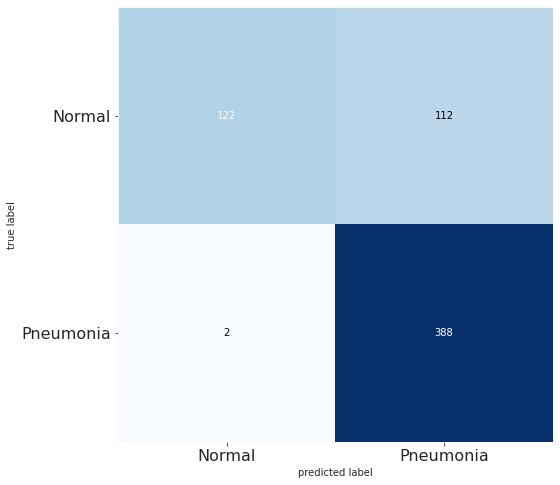

In [ ]:
# Prikazivanje konfuzione matrice sa test podacima
test_preds = []
for i in range(len(test_predictions)):
  test_preds.append(get_pred_label(test_predictions[i]))

cm2 = confusion_matrix(test_labels, test_preds)
plt.figure()
plot_confusion_matrix(cm2, figsize=(12,8), hide_ticks=True, cmap=plt.cm.Blues)
plt.xticks(range(2), ['Normal', 'Pneumonia'], fontsize=16)
plt.yticks(range(2), ['Normal', 'Pneumonia'], fontsize=16)
plt.show()

In [ ]:
# Preciznost i kompletnost klasifikatora
tn, fp, fn, tp = cm2.ravel()

precision = tp/(tp+fp)
recall = tp/(tp+fn)

print("Recall of the model is {:.2f}".format(recall))
print("Precision of the model is {:.2f}".format(precision))

Recall of the model is 0.99
Precision of the model is 0.78


## Treniranje modela nad balansiranim podacima

S obzirom da model koji smo trenirali sa svim podacima, pored velike tacnosti, ima malu preciznost zbog disbalansa podataka, sledece sto cemo uraditi je kreirati model sa podjednakim brojem slika za svaku klasu

In [ ]:
normal_filenames = tf.io.gfile.glob(str('drive/My Drive/Chest X-Ray/chest_xray/train/NORMAL/*'))
pneumonia_filenames = tf.io.gfile.glob(str('drive/My Drive/Chest X-Ray/chest_xray/train/PNEUMONIA/*'))
pneumonia_filenames = pneumonia_filenames[:len(normal_filenames)]

balanced_filenames = normal_filenames + pneumonia_filenames

len(balanced_filenames)

2682

/usr/local/lib/python3.6/dist-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning


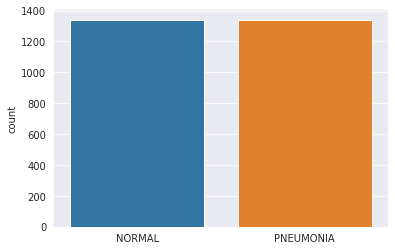

In [ ]:
balanced_pneumonia_labels = pneumonia_labels[:len(normal_labels)]
balanced_labels = normal_labels + balanced_pneumonia_labels

len(balanced_labels)
sns.set_style('darkgrid')
sns.countplot(balanced_labels)

In [ ]:
balanced_boolean_labels = [label == classes for label in balanced_labels]

len(balanced_boolean_labels)

2682

In [ ]:
X = balanced_filenames
y = balanced_boolean_labels
X, y = shuffle(X,y,random_state=42)

X[:10], y[:10]

(['drive/My Drive/Chest X-Ray/chest_xray/train/NORMAL/NORMAL2-IM-0820-0001.jpeg',
  'drive/My Drive/Chest X-Ray/chest_xray/train/PNEUMONIA/person966_bacteria_2891.jpeg',
  'drive/My Drive/Chest X-Ray/chest_xray/train/PNEUMONIA/person773_virus_1402.jpeg',
  'drive/My Drive/Chest X-Ray/chest_xray/train/PNEUMONIA/person553_virus_1093.jpeg',
  'drive/My Drive/Chest X-Ray/chest_xray/train/NORMAL/NORMAL2-IM-1093-0001.jpeg',
  'drive/My Drive/Chest X-Ray/chest_xray/train/NORMAL/NORMAL2-IM-1020-0001.jpeg',
  'drive/My Drive/Chest X-Ray/chest_xray/train/PNEUMONIA/person943_bacteria_2868.jpeg',
  'drive/My Drive/Chest X-Ray/chest_xray/train/NORMAL/NORMAL2-IM-1400-0001.jpeg',
  'drive/My Drive/Chest X-Ray/chest_xray/train/PNEUMONIA/person504_bacteria_2130.jpeg',
  'drive/My Drive/Chest X-Ray/chest_xray/train/PNEUMONIA/person470_bacteria_2000.jpeg'],
 [array([ True, False]),
  array([False,  True]),
  array([False,  True]),
  array([False,  True]),
  array([ True, False]),
  array([ True, False]),

In [ ]:
balanced_data = create_data_batches(X,y)

Creating training data batches...


In [ ]:
balanced_model = create_model()

Building model with: https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/4


In [ ]:
#balanced_model.fit(x=balanced_data,
 #               epochs=NUM_EPOCHS,
  #              callbacks=[full_model_tensorboard, full_model_early_stopping])

Epoch 1/100
84/84 [==============================] - 46s 547ms/step - loss: 0.2038 - accuracy: 0.9247
Epoch 2/100
84/84 [==============================] - 45s 538ms/step - loss: 0.1208 - accuracy: 0.9567
Epoch 3/100
84/84 [==============================] - 44s 529ms/step - loss: 0.0995 - accuracy: 0.9653
Epoch 4/100
84/84 [==============================] - 44s 526ms/step - loss: 0.0942 - accuracy: 0.9627
Epoch 5/100
84/84 [==============================] - 44s 524ms/step - loss: 0.0826 - accuracy: 0.9709
Epoch 6/100
84/84 [==============================] - 44s 529ms/step - loss: 0.0764 - accuracy: 0.9732
Epoch 7/100
84/84 [==============================] - 45s 532ms/step - loss: 0.0748 - accuracy: 0.9728
Epoch 8/100
84/84 [==============================] - 44s 525ms/step - loss: 0.0704 - accuracy: 0.9754
Epoch 9/100
84/84 [==============================] - 44s 523ms/step - loss: 0.0658 - accuracy: 0.9746
Epoch 10/100
84/84 [==============================] - 44s 523ms/step - loss: 0.061

In [ ]:
save_model(balanced_model, suffix="balanced-image-set")

Saving model to: drive/My Drive/Chest X-Ray/models/20201101-225935-balanced-image-set.h5...


'drive/My Drive/Chest X-Ray/models/20201101-225935-balanced-image-set.h5'

In [ ]:
loaded_balanced_model = load_model("drive/My Drive/Chest X-Ray/models/20201101-225935-balanced-image-set.h5")

Loading saved model from: drive/My Drive/Chest X-Ray/models/20201101-225935-balanced-image-set.h5


In [ ]:
test_predictions = loaded_balanced_model.predict(test_data,
                                          verbose=1)

20/20 [==============================] - 8s 388ms/step


<Figure size 432x288 with 0 Axes>

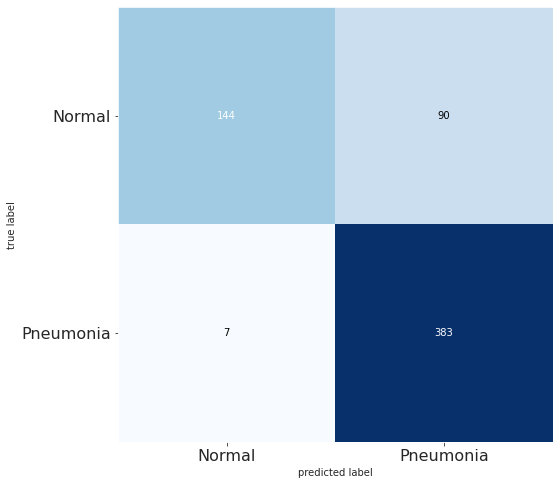

In [ ]:
test_preds = []
for i in range(len(test_predictions)):
  test_preds.append(get_pred_label(test_predictions[i]))

cm2 = confusion_matrix(test_labels, test_preds)
plt.figure()
plot_confusion_matrix(cm2, figsize=(12,8), hide_ticks=True, cmap=plt.cm.Blues)
plt.xticks(range(2), ['Normal', 'Pneumonia'], fontsize=16)
plt.yticks(range(2), ['Normal', 'Pneumonia'], fontsize=16)
plt.show()

In [ ]:
tn, fp, fn, tp = cm2.ravel()

precision = tp/(tp+fp)
recall = tp/(tp+fn)

print("Recall of the model is {:.2f}".format(recall))
print("Precision of the model is {:.2f}".format(precision))

Recall of the model is 0.98
Precision of the model is 0.81


## Obavljanje predviđanja nad prilagođenim slikama

Da bi obavili predviđanja nad prilagođenim slikama, moramo da:
* Uzmemo putanje naših slika.
* Pretvorimo putanje u grupe podataka pomoću funkcije `create_data_batches()`.
Pošto ovog puta nemamo oznake, postavićemo `test_data` parametar na `True`.
* Prosledimo podatke prilagođenih slika u funkciju `predict()`.
* Pretvorimo vrednost predviđanja u oznaku.
* Uporedimo oznaku sa slikom.

In [ ]:
# Uzeti putanju do prilagođenih slika
custom_path = "drive/My Drive/Chest X-Ray/chest_xray/custom_test_images/"
custom_image_paths = [custom_path + fname for fname in os.listdir(custom_path)]

In [ ]:
custom_image_paths

['drive/My Drive/Chest X-Ray/chest_xray/custom_test_images/Normal-3.jpeg',
 'drive/My Drive/Chest X-Ray/chest_xray/custom_test_images/Normal-1.jpeg',
 'drive/My Drive/Chest X-Ray/chest_xray/custom_test_images/Normal-2.jpeg',
 'drive/My Drive/Chest X-Ray/chest_xray/custom_test_images/Pneumonia-1.jpeg',
 'drive/My Drive/Chest X-Ray/chest_xray/custom_test_images/Pneumonia-2.jpeg',
 'drive/My Drive/Chest X-Ray/chest_xray/custom_test_images/Pneumonia-3.jpeg']

In [ ]:
# Pretvaranje prilagođenih slika u skup podataka
custom_data = create_data_batches(custom_image_paths, test_data=True)
custom_data

Creating test data batches...


<BatchDataset shapes: (None, 224, 224, 3), types: tf.float32>

In [ ]:
# Obavljanje predviđanja nad prilagođenim podacima
custom_preds = loaded_full_model.predict(custom_data)

In [ ]:
custom_pred_labels = [get_pred_label(custom_preds[i]) for i in range(len(custom_preds))]
custom_pred_labels

['NORMAL', 'PNEUMONIA', 'NORMAL', 'PNEUMONIA', 'PNEUMONIA', 'PNEUMONIA']

In [ ]:
# Pokupljanje prilagođenih slika
custom_images = []
for image in custom_data.unbatch().as_numpy_iterator():
  custom_images.append(image)

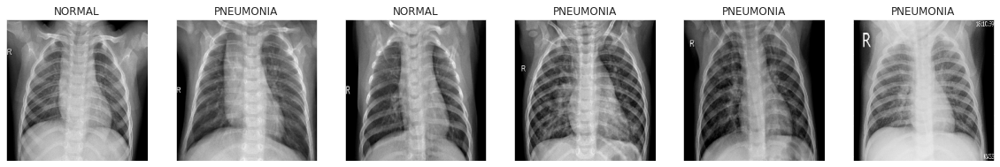

In [ ]:
# Prikaz predviđanja nad prilagođenim slikama
plt.figure(figsize=(20,20))
for i,image in enumerate(custom_images):
  plt.subplot(1,6,i+1)
  plt.xticks([])
  plt.yticks([])
  plt.title(custom_pred_labels[i])
  plt.imshow(image)